In [2]:
%matplotlib inline
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

%load_ext autoreload
%autoreload 2

# Display entire width of browser
from IPython.display import display, HTML
display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 65%; }
    div#maintoolbar-container { width: 99%; }
</style>
"""))

In [29]:
def plot_two(img1, img2):
    imPlot1 = img1[:,:,::-1]
    imPlot2 = img2[:,:,::-1]
    
    width, height = imPlot1.shape[:2]

    fig = plt.figure(figsize=(width/10, height/10))

    columns = 2
    rows = 1

    fig.add_subplot(rows, columns, 1)
    plt.imshow(imPlot1)

    fig.add_subplot(rows, columns, 2)
    plt.imshow(imPlot2)
    
    plt.show()

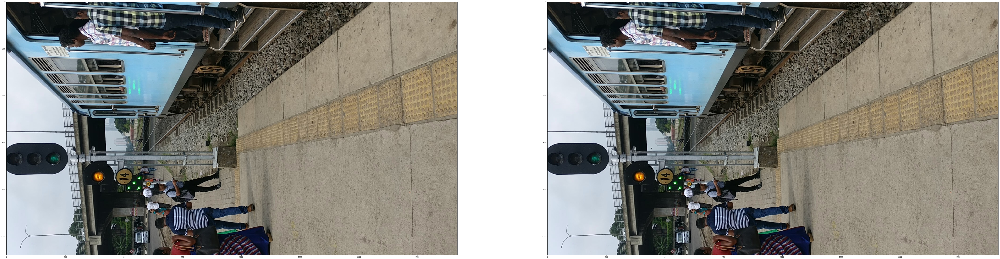

In [16]:
imLights = cv.imread('../images/VID_20190207_103142/frame0.jpg')
plot_two(imLights, imLights)

(96, 96, 3)


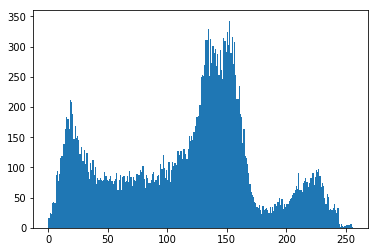

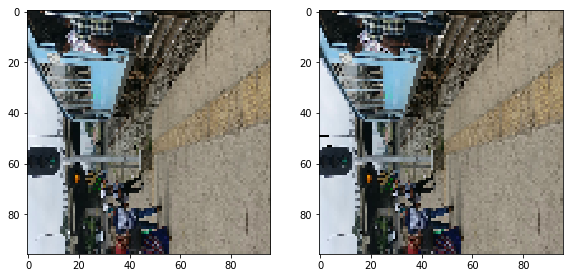

In [35]:
resized = cv.resize(imLights, (96,96))
rows,cols,chanels = resized.shape
print(resized.shape)

plt.hist(resized.ravel(),256,[0,256]); plt.show()
replaced = resized.copy()
for x in range(rows):
    for y in range(cols):
        pixel = replaced[x,y]
        if pixel[0] > 250 or pixel[1] > 250 or pixel[2] > 250:
            replaced[x,y] = [0,0,0]
plot_two(resized,replaced )


In [36]:
def drawContours(img):
    imgray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    ret, thresh = cv.threshold(imgray, 127, 255, 0)
    contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    cont = cv.drawContours(img, contours, -1, (0,255,0), 3)

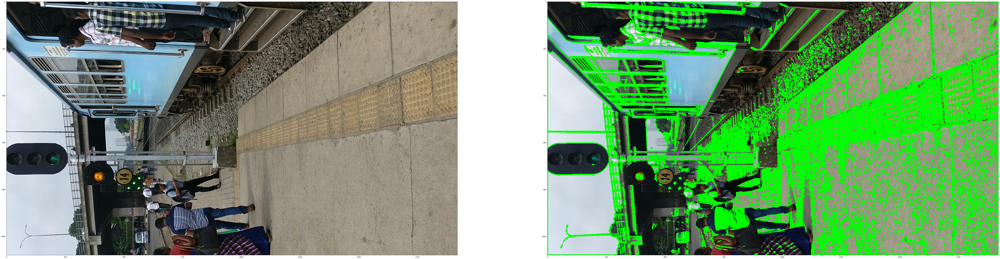

In [37]:
output_img = imLights.copy()
drawContours(output_img)
plot_two(imLights, output_img)